<a href="https://colab.research.google.com/github/emsieler/Sketch-to-Video/blob/main/pix2pix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install

In [ ]:
!git clone https://github.com/emsieler/pytorch-CycleGAN-and-pix2pix.git

Cloning into 'pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2515, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 2515 (delta 0), reused 1 (delta 0), pack-reused 2512
Receiving objects: 100% (2515/2515), 8.20 MiB | 28.76 MiB/s, done.
Resolving deltas: 100% (1574/1574), done.


In [ ]:
import os
os.chdir('pytorch-CycleGAN-and-pix2pix/')

In [ ]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 28.0 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvi

# Datasets

Download one of the official datasets with:

-   `bash ./datasets/download_pix2pix_dataset.sh [cityscapes, night2day, edges2handbags, edges2shoes, facades, maps]`

Or use your own dataset by creating the appropriate folders and adding in the images. Follow the instructions [here](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/docs/datasets.md#pix2pix-datasets).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_dir = '../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/augmented_dataset/'
photo_dir = '../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/augmented_dataset/strawberry'
sketch_dir = '../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/augmented_dataset/sketch'

In [ ]:
!pwd

/content/pytorch-CycleGAN-and-pix2pix


In [ ]:
!python datasets/combine_A_and_B.py --fold_A '../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/augmented_dataset/strawberry' --fold_B '../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/augmented_dataset/sketch' --fold_AB '../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/strawberry_combined'

[fold_A] =  ../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/augmented_dataset/strawberry
[fold_B] =  ../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/augmented_dataset/sketch
[fold_AB] =  ../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/strawberry_combined
[num_imgs] =  1000000
[use_AB] =  False
[no_multiprocessing] =  False
Traceback (most recent call last):
  File "/content/pytorch-CycleGAN-and-pix2pix/datasets/combine_A_and_B.py", line 35, in <module>
    img_list = os.listdir(img_fold_A)
NotADirectoryError: [Errno 20] Not a directory: '../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/augmented_dataset/strawberry/augmented_0.png'


In [ ]:
%cd pytorch-CycleGAN-and-pix2pix/

/content/pytorch-CycleGAN-and-pix2pix


In [ ]:
#!bash ./datasets/download_pix2pix_dataset.sh facades

# Pretrained models

Download one of the official pretrained models with:

-   `bash ./scripts/download_pix2pix_model.sh [edges2shoes, sat2map, map2sat, facades_label2photo, and day2night]`

Or add your own pretrained model to `./checkpoints/{NAME}_pretrained/latest_net_G.pt`

In [ ]:
!bash ./scripts/download_pix2pix_model.sh edges2shoes

Note: available models are edges2shoes, sat2map, map2sat, facades_label2photo, and day2night
Specified [edges2shoes]
for details.

--2024-05-10 17:16:30--  http://efrosgans.eecs.berkeley.edu/pix2pix/models-pytorch/edges2shoes.pth
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 217704688 (208M)
Saving to: ‘./checkpoints/edges2shoes_pretrained/latest_net_G.pth’

./checkpoints/edges 100%[===================>] 207.62M  71.4MB/s    in 2.9s    

2024-05-10 17:16:33 (71.4 MB/s) - ‘./checkpoints/edges2shoes_pretrained/latest_net_G.pth’ saved [217704688/217704688]



# Training -- did not use

-   `python train.py --dataroot ./datasets/facades --name facades_pix2pix --model pix2pix --direction BtoA`

Change the `--dataroot` and `--name` to your own dataset's path and model's name. Use `--gpu_ids 0,1,..` to train on multiple GPUs and `--batch_size` to change the batch size. Add `--direction BtoA` if you want to train a model to transfrom from class B to A.

In [ ]:
!python train.py --dataroot ./datasets/facades --name facades_pix2pix --model pix2pix --direction BtoA --display_id -1

----------------- Options ---------------
               batch_size: 1                             
                    beta1: 0.5                           
          checkpoints_dir: ./checkpoints                 
           continue_train: False                         
                crop_size: 256                           
                 dataroot: ./datasets/facades            	[default: None]
             dataset_mode: aligned                       
                direction: BtoA                          	[default: AtoB]
              display_env: main                          
             display_freq: 400                           
               display_id: -1                            	[default: 1]
            display_ncols: 4                             
             display_port: 8097                          
           display_server: http://localhost              
          display_winsize: 256                           
                    epoch: latest          

# Testing

-   `python test.py --dataroot ./datasets/facades --direction BtoA --model pix2pix --name facades_pix2pix`

Change the `--dataroot`, `--name`, and `--direction` to be consistent with your trained model's configuration and how you want to transform images.

> from https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix:
> Note that we specified --direction BtoA as Facades dataset's A to B direction is photos to labels.

> If you would like to apply a pre-trained model to a collection of input images (rather than image pairs), please use --model test option. See ./scripts/test_single.sh for how to apply a model to Facade label maps (stored in the directory facades/testB).

> See a list of currently available models at ./scripts/download_pix2pix_model.sh

In [ ]:
!ls checkpoints/

edges2shoes_pretrained


In [ ]:
data_dir = '../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/strawberry/'

In [ ]:
#prev --model test, BtoA

In [ ]:
!set -ex
!python test.py --dataroot '../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/strawberry/' --name edges2shoes_pretrained --model test --netG unet_256 --direction BtoA --dataset_mode single --norm batch

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: ../drive/MyDrive/Applied CV Project/Sketch to Image/datasets/strawberry/	[default: None]
             dataset_mode: single                        
                direction: BtoA                          	[default: AtoB]
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                  gpu_ids: 0                             
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None

In [ ]:
#!python test.py --dataroot ./datasets/facades --direction BtoA --model pix2pix --name facades_label2photo_pretrained --use_wandb

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: ./datasets/facades            	[default: None]
             dataset_mode: aligned                       
                direction: BtoA                          	[default: AtoB]
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                  gpu_ids: 0                             
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0            

# Visualize

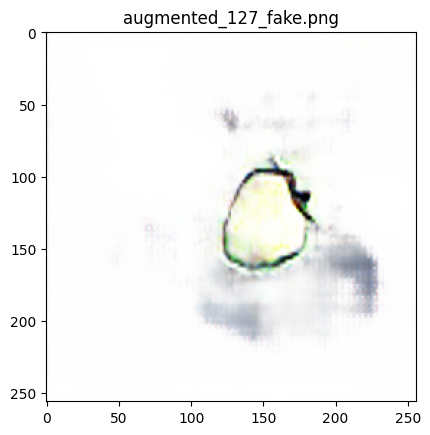

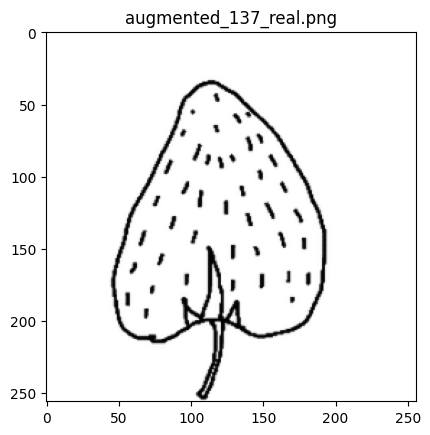

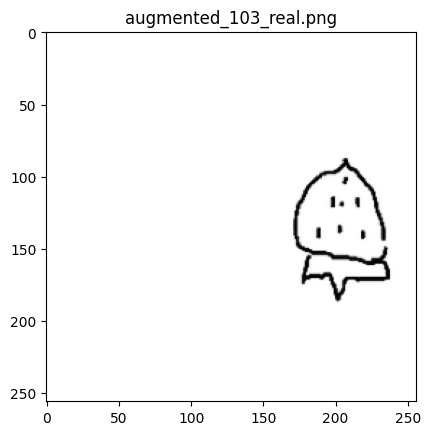

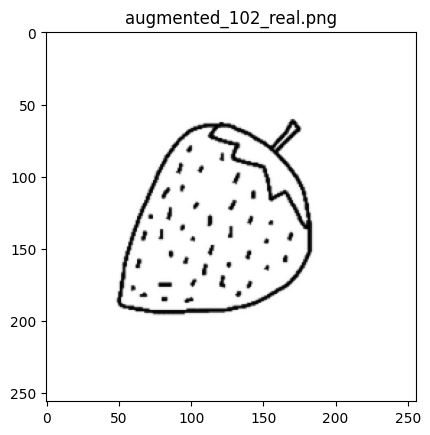

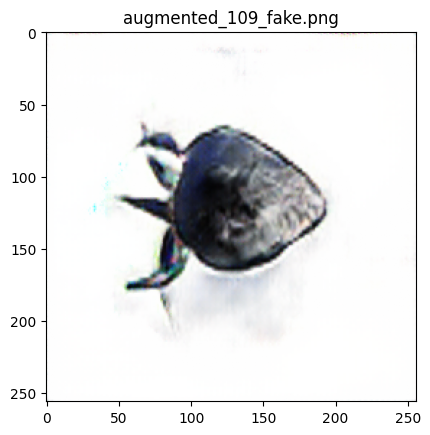

...

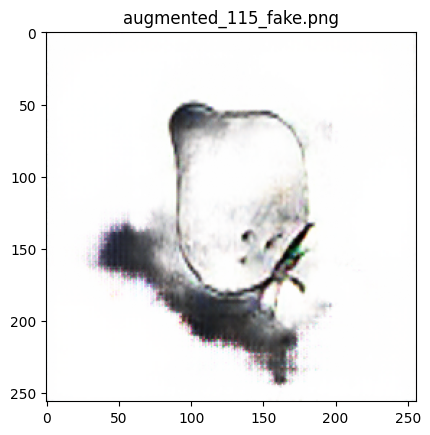

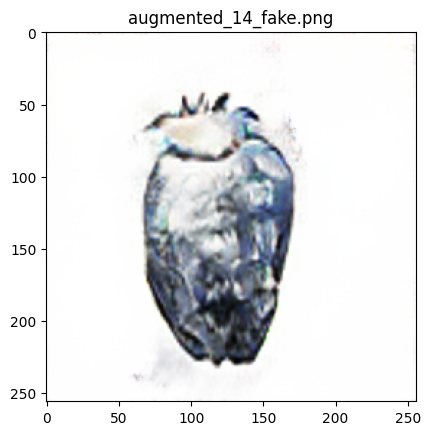

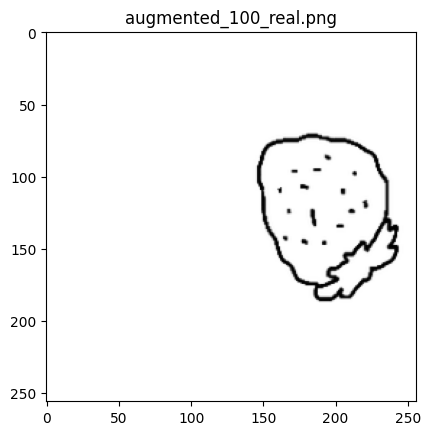

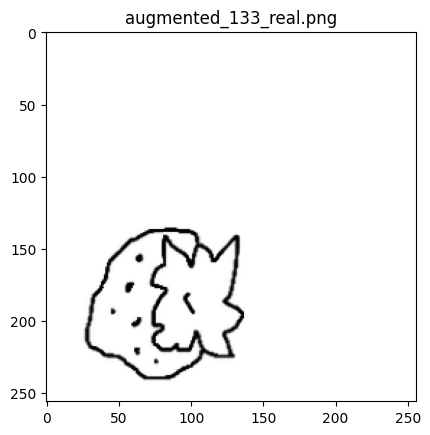

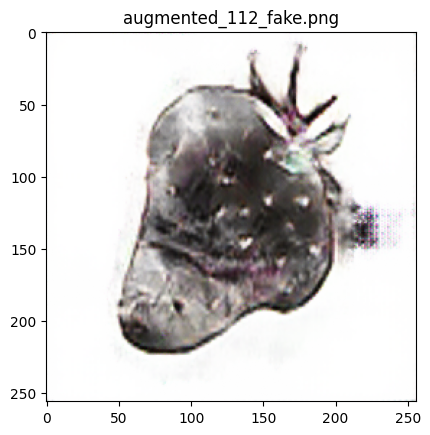

In [ ]:
import matplotlib.pyplot as plt

#img = plt.imread('./results/facades_label2photo_pretrained/test_latest/images/100_fake_B.png')
img_dir = './results/edges2shoes_pretrained/test_latest/images/'
for filename in os.listdir(img_dir):
    if filename.endswith('.png') or filename.endswith('.jpg'):
        img = plt.imread(os.path.join(img_dir, filename))
        plt.imshow(img)
        plt.title(filename)
        plt.show()